<a href="https://colab.research.google.com/github/Haadi-kp/Image_Colourization/blob/main/Colab_Notebooks/Copy_of_fine_tuning_1_image_colorization_25_12_2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Create the destination folder if it doesn't exist
!mkdir -p /content/datas


# Unzip files into the 'datas' folder
!unzip /content/drive/MyDrive/image_colouring/ImageNetDataset.zip -d /content/datas


Streaming output truncated to the last 5000 lines.
  inflating: /content/datas/00900/054653537039094.jpg  
  inflating: /content/datas/00900/07272256002875288.jpg  
  inflating: /content/datas/00900/075874938728387464.jpg  
  inflating: /content/datas/00900/084355288443908.jpg  
  inflating: /content/datas/00900/0938813935621416.jpg  
  inflating: /content/datas/00900/1655568257304816.jpg  
  inflating: /content/datas/00900/17337161967825.jpg  
  inflating: /content/datas/00900/185287956232336.jpg  
  inflating: /content/datas/00900/1898108151581965.jpg  
  inflating: /content/datas/00900/204089788662087.jpg  
  inflating: /content/datas/00900/2464974905916646.jpg  
  inflating: /content/datas/00900/262262197475642.jpg  
  inflating: /content/datas/00900/2677013029370365.jpg  
  inflating: /content/datas/00900/2823587208350367.jpg  
  inflating: /content/datas/00900/2846489896468567.jpg  
  inflating: /content/datas/00900/300747621842155.jpg  
  inflating: /content/datas/00900/33507644

In [ ]:
import tensorflow as tf

# File paths for the saved models
generator_file_path = '/content/drive/MyDrive/saved_model/generator_model2.h5'
discriminator_file_path = '/content/drive/MyDrive/saved_model/discriminator_model2.h5'

# Load the models
generator = tf.keras.models.load_model(generator_file_path, custom_objects={'mse': tf.keras.losses.MeanSquaredError()})  # Add custom_objects
discriminator = tf.keras.models.load_model(discriminator_file_path)

print("Generator and Discriminator models loaded successfully.")




Generator and Discriminator models loaded successfully.


In [ ]:
generator.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002),
    loss='mse',
    metrics=['accuracy']
)

discriminator.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002),
    loss='binary_crossentropy',
    metrics=['accuracy']
)


In [ ]:
import os
import numpy as np
from PIL import Image
from sklearn.model_selection import train_test_split
import tensorflow as tf

# Configuration
batch_size = 64
img_size = 120
max_folders = 50
images_per_folder = 50  # Use 50 images per folder
master_dir = '/content/datas'

# Initialize arrays for grayscale and RGB images
x = []  # Grayscale images
y = []  # RGB images

# Get and sort folder names, skipping the first 50 folders
all_folders = sorted([folder for folder in os.listdir(master_dir) if os.path.isdir(os.path.join(master_dir, folder))])
folders_to_process = all_folders[50:50 + max_folders]  # Next 25 folders

# Process each folder
for folder_name in folders_to_process:
    folder_path = os.path.join(master_dir, folder_name)
    print(f"Processing folder: {folder_name}")

    processed_images = 0  # Counter to track processed images
    for image_file in os.listdir(folder_path):
        if processed_images >= images_per_folder:  # Stop after 50 images
            break
        image_path = os.path.join(folder_path, image_file)
        try:
            # Load and preprocess the image
            rgb_image = Image.open(image_path).resize((img_size, img_size))
            rgb_array = np.asarray(rgb_image) / 255.0  # Normalize RGB

            # Convert the RGB image to grayscale
            gray_image = rgb_image.convert('L')  # Convert to grayscale
            gray_array = np.asarray(gray_image).reshape((img_size, img_size, 1)) / 255.0  # Normalize grayscale

            # Append grayscale and RGB arrays
            x.append(gray_array)
            y.append(rgb_array)

            processed_images += 1  # Increment the image counter
        except Exception as e:
            print(f"Error processing image {image_path}: {e}")

# Train-test splitting
train_x, test_x, train_y, test_y = train_test_split(np.array(x), np.array(y), test_size=0.1)

# Create tf.data.Dataset objects for training and testing
train_dataset = tf.data.Dataset.from_tensor_slices((train_x, train_y)).batch(batch_size).shuffle(100)
test_dataset = tf.data.Dataset.from_tensor_slices((test_x, test_y)).batch(batch_size)


Processing folder: 00050
Processing folder: 00051
Processing folder: 00052
Processing folder: 00053
Processing folder: 00054
Processing folder: 00055
Processing folder: 00056
Processing folder: 00057
Processing folder: 00058
Processing folder: 00059
Processing folder: 00060
Processing folder: 00061
Processing folder: 00062
Processing folder: 00063
Processing folder: 00064
Processing folder: 00065
Processing folder: 00066
Processing folder: 00067
Processing folder: 00068
Processing folder: 00069
Processing folder: 00070
Processing folder: 00071
Processing folder: 00072
Processing folder: 00073
Processing folder: 00074
Processing folder: 00075
Processing folder: 00076
Processing folder: 00077
Processing folder: 00078
Processing folder: 00079
Processing folder: 00080
Processing folder: 00081
Processing folder: 00082
Processing folder: 00083
Processing folder: 00084
Processing folder: 00085
Processing folder: 00086
Processing folder: 00087
Processing folder: 00088
Processing folder: 00089


In [ ]:
import tensorflow as tf

# Create the VGG16 model outside the perceptual_loss function
vgg = tf.keras.applications.VGG16(include_top=False, weights="imagenet", input_shape=(img_size, img_size, 3))
vgg.trainable = False
feature_extractor = tf.keras.Model(inputs=vgg.input, outputs=vgg.get_layer("block3_conv3").output)

# Generator loss
def generator_loss(fake_output):
    return tf.keras.losses.BinaryCrossentropy(from_logits=True)(tf.ones_like(fake_output), fake_output)

# Discriminator loss
def discriminator_loss(real_output, fake_output):
       real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=False)(tf.ones_like(real_output), real_output)
       fake_loss = tf.keras.losses.BinaryCrossentropy(from_logits=False)(tf.zeros_like(fake_output), fake_output)
       return real_loss + fake_loss

# Perceptual loss
def perceptual_loss(real, fake):
    # Use the pre-created VGG16 model and feature extractor
    real_features = feature_extractor(real)
    fake_features = feature_extractor(fake)
    return tf.reduce_mean(tf.square(real_features - fake_features))

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=1e-5, beta_1=0.5)


In [ ]:
import tensorflow as tf

@tf.function
def train_step(grayscale, color):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape: # Create separate tapes
        # Generate fake color images
        fake_color = generator(grayscale, training=True)

        # Discriminator outputs
        real_output = discriminator(color, training=True)
        fake_output = discriminator(fake_color, training=True)

        # Calculate losses
        gen_loss = generator_loss(fake_output) + 0.1 * perceptual_loss(color, fake_color)
        disc_loss = discriminator_loss(real_output, fake_output)

    # Update generator and discriminator
    generator_gradients = gen_tape.gradient(gen_loss, generator.trainable_variables) # Use gen_tape
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables) # Use disc_tape

    generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

    return gen_loss, disc_loss # Explicitly return losses

In [ ]:
import os

# Set up checkpoint saving
checkpoint_dir = "./checkpoints"
os.makedirs(checkpoint_dir, exist_ok=True)
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator=generator, discriminator=discriminator)

# Training loop
epochs = 50
for epoch in range(epochs):
    print(f"Epoch {epoch + 1}/{epochs}")
    # Replace new_dataset with train_dataset for training
    for grayscale_batch, color_batch in train_dataset:
        gen_loss, disc_loss = train_step(grayscale_batch, color_batch)
    print(f"Generator Loss: {gen_loss.numpy()}, Discriminator Loss: {disc_loss.numpy()}")

    # Save checkpoint
    # checkpoint.save(file_prefix=checkpoint_prefix)

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/nn.py:707: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


Generator Loss: 1.9495689868927002, Discriminator Loss: 1.2639296054840088
Epoch 2/50
Generator Loss: 1.784528374671936, Discriminator Loss: 1.6747640371322632
Epoch 3/50
Generator Loss: 1.8928673267364502, Discriminator Loss: 1.3119540214538574
Epoch 4/50
Generator Loss: 1.869288682937622, Discriminator Loss: 1.2236862182617188
Epoch 5/50
Generator Loss: 1.6888844966888428, Discriminator Loss: 1.2667858600616455
Epoch 6/50
Generator Loss: 1.7751624584197998, Discriminator Loss: 1.1359648704528809
Epoch 7/50
Generator Loss: 1.8158626556396484, Discriminator Loss: 1.3199111223220825
Epoch 8/50
Generator Loss: 1.9703888893127441, Discriminator Loss: 1.0471562147140503
Epoch 9/50
Generator Loss: 1.7247462272644043, Discriminator Loss: 1.069299340248108
Epoch 10/50
Generator Loss: 3.050571918487549, Discriminator Loss: 1.9956938028335571
Epoch 11/50
Generator Loss: 2.350281238555908, Discriminator Loss: 1.1705124378204346
Epoch 12/50
Generator Loss: 3.2884674072265625, Discriminator Loss: 

In [ ]:
# Ensure the generator is compiled before saving
generator.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002),
    loss='mse',  # Use Mean Squared Error or a loss suitable for your task
    metrics=['accuracy']
)

# Save the generator model to a single HDF5 file
generator_file_path = '/content/drive/MyDrive/saved_model/finetune_generator_model.h5'
generator.save(generator_file_path)
print(f"Generator model saved to {generator_file_path}")

# Ensure the discriminator is compiled before saving
discriminator.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0002),
    loss='binary_crossentropy',  # Use Binary Crossentropy or a loss suitable for your task
    metrics=['accuracy']
)

# Save the discriminator model to a single HDF5 file
discriminator_file_path = '/content/drive/MyDrive/saved_model/finetune_discriminator_model.h5'
discriminator.save(discriminator_file_path)
print(f"Discriminator model saved to {discriminator_file_path}")


Generator model saved to /content/drive/MyDrive/saved_model/finetune_generator_model.h5
Discriminator model saved to /content/drive/MyDrive/saved_model/finetune_discriminator_model.h5


In [ ]:
import tensorflow as tf

# File paths for the saved models
generator_file_path = '/content/drive/MyDrive/saved_model/finetune_generator_model.h5'
discriminator_file_path = '/content/drive/MyDrive/saved_model/finetune_discriminator_model.h5'

# Load the models
generator = tf.keras.models.load_model(generator_file_path)  # Add custom_objects
discriminator = tf.keras.models.load_model(discriminator_file_path)

print("Generator and Discriminator models loaded successfully.")




Generator and Discriminator models loaded successfully.


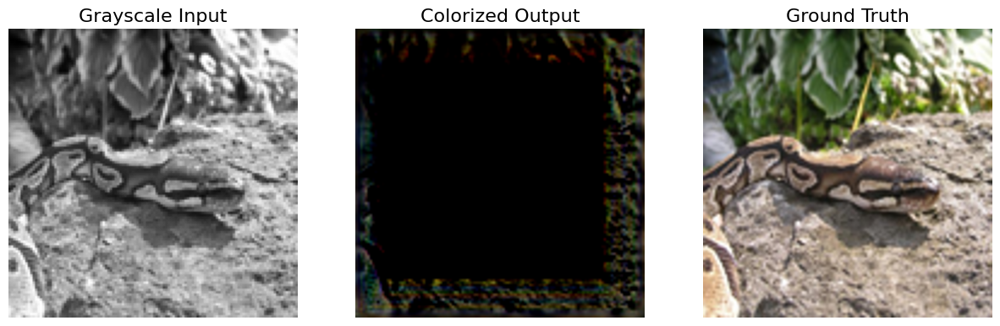

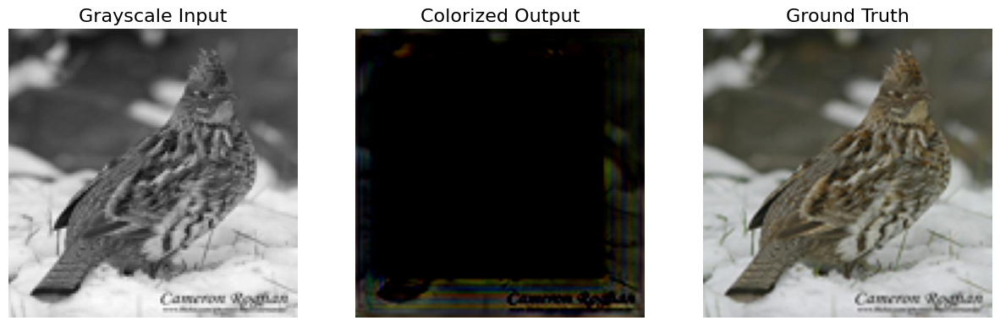

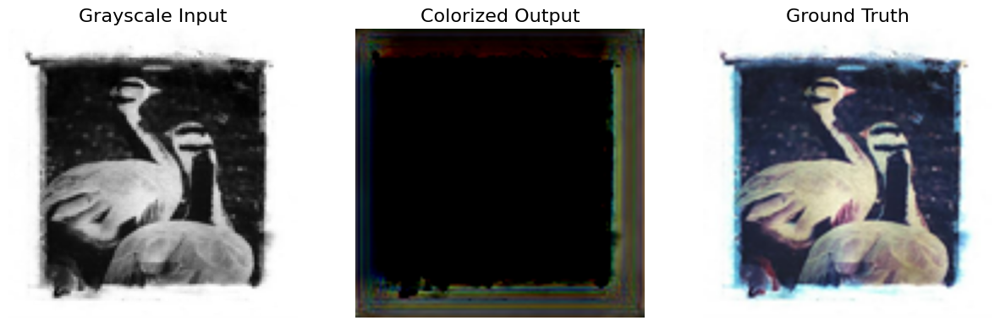

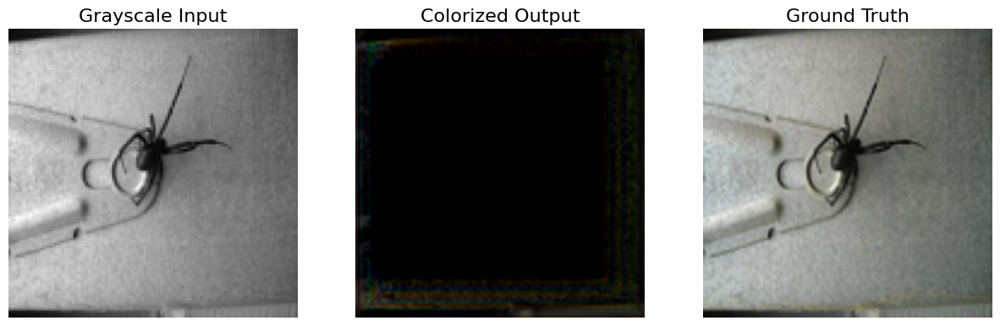

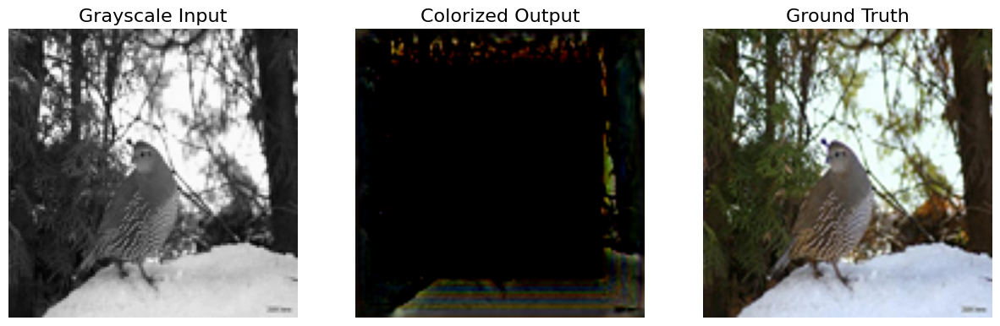

...

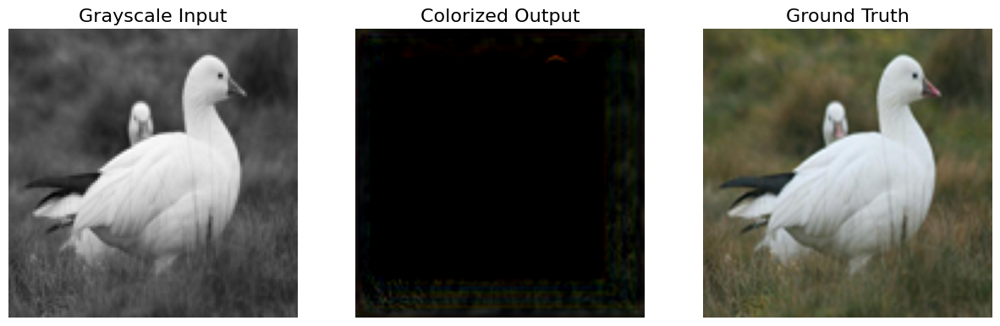

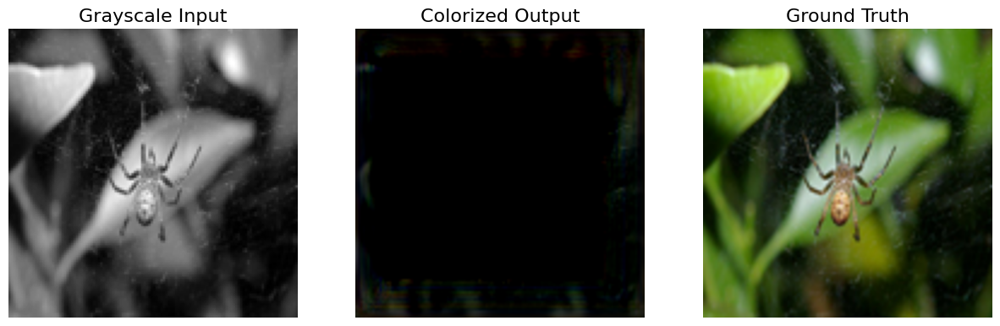

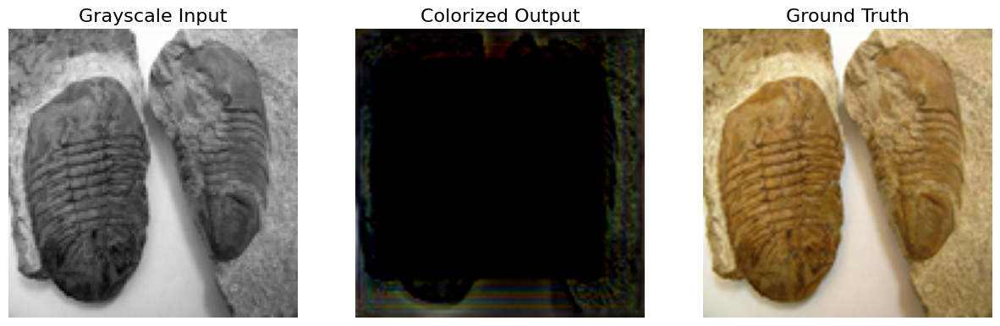

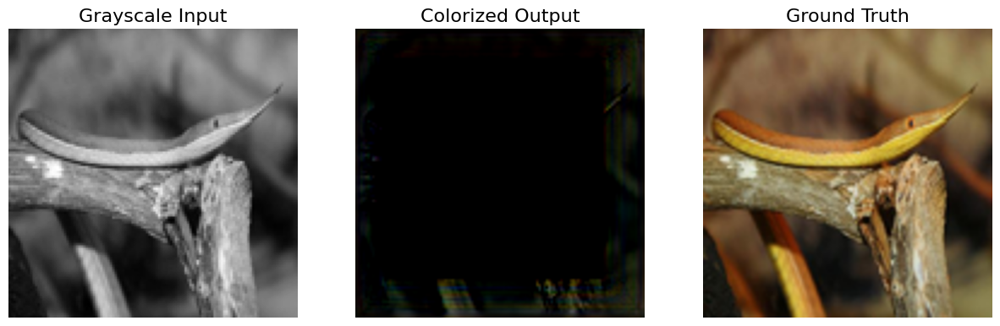

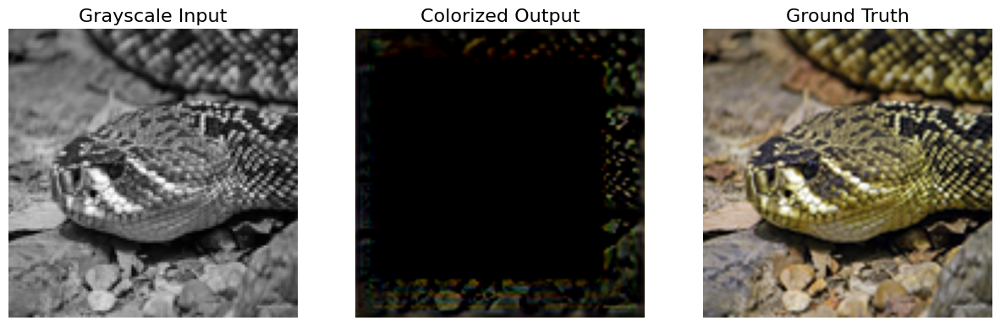

KeyboardInterrupt: 

In [ ]:
from io import BytesIO
import requests
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# # Ensure generator model is initialized

# # Load trained weights if available
# # generator.load_weights("path_to_model_weights.h5")

# Visualize results for testing data
for i in range(len(test_x)):
    try:
        # Prepare grayscale input
        test_image = test_x[i].reshape(1, 120, 120, 1)  # Reshape to match model input

        # Generate colorized output
        colorized_output = generator(test_image).numpy()

        # Visualize the input, colorized output, and ground truth
        plt.figure(figsize=(15, 5))

        # Grayscale Input
        or_image = plt.subplot(1, 3, 1)
        or_image.set_title('Grayscale Input', fontsize=16)
        plt.imshow(test_x[i].reshape((120, 120)), cmap='gray')
        plt.axis('off')

        # Colorized Output
        in_image = plt.subplot(1, 3, 2)
        colorized_img = Image.fromarray((colorized_output[0] * 255).astype('uint8')).resize((1024, 1024))
        in_image.set_title('Colorized Output', fontsize=16)
        plt.imshow(colorized_img)
        plt.axis('off')

        # Ground Truth
        ou_image = plt.subplot(1, 3, 3)
        ground_truth_img = Image.fromarray((test_y[i] * 255).astype('uint8')).resize((1024, 1024))
        ou_image.set_title('Ground Truth', fontsize=16)
        plt.imshow(ground_truth_img)
        plt.axis('off')

        plt.show()

    except Exception as e:
        print(f"Error processing image {i + 1}: {e}")


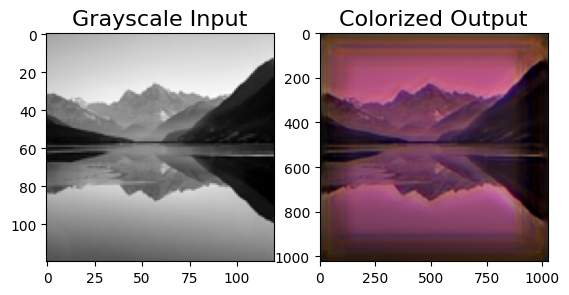

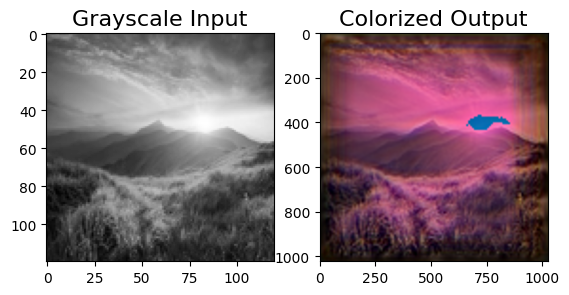

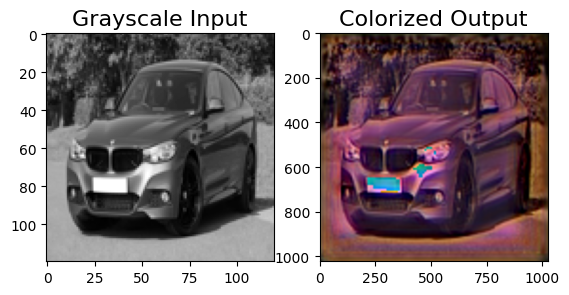

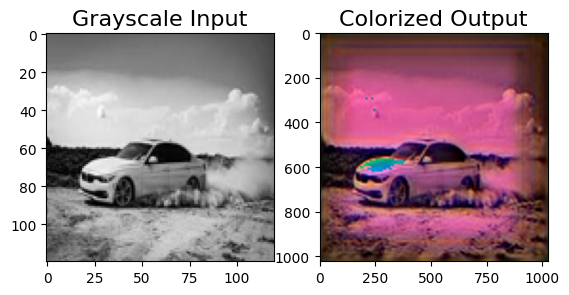

In [ ]:


# Define a function to download and process an image from a URL
def process_image_from_url(url, target_size=(120, 120)):
    response = requests.get(url)
    if response.status_code == 200:
        # Open the image from the response
        image = Image.open(BytesIO(response.content)).convert("L")  # Convert to grayscale
        # Resize to the model's expected input size
        image = image.resize(target_size)
        # Normalize the image
        image_array = np.asarray(image) / 255.0
        # Add batch and channel dimensions
        return image_array.reshape(1, target_size[0], target_size[1], 1)
    else:
        raise Exception(f"Failed to fetch image from URL: {response.status_code}")

# List of image URLs
image_urls = [
    "https://images.pexels.com/photos/346529/pexels-photo-346529.jpeg?cs=srgb&dl=pexels-bri-schneiter-28802-346529.jpg&fm=jpg",
    "https://media.istockphoto.com/id/517188688/photo/mountain-landscape.jpg?s=612x612&w=0&k=20&c=A63koPKaCyIwQWOTFBRWXj_PwCrR4cEoOw2S9Q7yVl8=",
    "https://images.pexels.com/photos/170811/pexels-photo-170811.jpeg?cs=srgb&dl=pexels-mikebirdy-170811.jpg&fm=jpg",
    "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSzrMllu8JUuu4lUfJ21cmtXbQZXiN2oK_Z0M5UZPhM8D8Yek9KZPJnWst-bm7ml2G_ydE&usqp=CAU"
    # Add more image URLs here
]

# Iterate over the image URLs and test the model
for i, url in enumerate(image_urls):
    try:
        # Process the image
        test_image = process_image_from_url(url)

        # Generate colorized output
        colorized_output = generator(test_image).numpy()

        # Visualize the input and output
        plt.figure(figsize=(10, 10))

        # Grayscale Input
        or_image = plt.subplot(1, 3, 1)
        or_image.set_title('Grayscale Input', fontsize=16)
        plt.imshow(test_image[0].reshape((120, 120)), cmap='gray')

        # Colorized Output
        in_image = plt.subplot(1, 3, 2)
        output_image = Image.fromarray((colorized_output[0] * 255).astype('uint8')).resize((1024, 1024))
        in_image.set_title('Colorized Output', fontsize=16)
        plt.imshow(output_image)

        plt.show()

    except Exception as e:
        print(f"Error processing image {i + 1}: {e}")
